First, I will start by importing the necessary libraries for data manipulation, visualization, and machine learning.

In [1]:
#Importing Libraries
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings

#Filtering Warnings
warnings.filterwarnings('ignore')

#Importing machine learning libraries
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import Dense

# Loading all dataset
We load the eye-tracking data from CSV files into a DataFrame and merge all participant data into a single DataFrame.

In [2]:
data_path = "CE888/EyeT/"

participants = range(1, 61)
trial_num = 1

All_files = []

for participant in participants:
    participant_files = os.listdir(data_path)
    participant_files = [f for f in participant_files if f.endswith(f"_participant_{participant}_trial_{trial_num}.csv")]
    if len(participant_files) == 0:
        print(f"missing file for {participant}")
        continue
    All_files.append(os.path.join(data_path, participant_files[0]))
len(All_files)

60

In [18]:
All_data = []

for files in All_files:
  data = pd.read_csv(files)
  All_data.append(data)

data = pd.concat(All_data)
print(data.shape)

(390380, 71)


In [19]:
data.head()

,Unnamed: 0,Recording timestamp,Computer timestamp,Sensor,Project name,Export date,Participant name,Recording name,Recording date,Recording date UTC,...,Original Media height,Eye movement type,Gaze event duration,Eye movement type index,Fixation point X,Fixation point Y,Fixation point X (MCSnorm),Fixation point Y (MCSnorm),Mouse position X,Mouse position Y
0,12532,13725441,604307462,NaN,Test group experiment,24.09.2020,Participant0001,Recording2,24.09.2020,24.09.2020,...,NaN,Saccade,25.0,125.0,NaN,NaN,NaN,NaN,NaN,NaN
1,12533,13725441,604307462,NaN,Test group experiment,24.09.2020,Participant0001,Recording2,24.09.2020,24.09.2020,...,NaN,Saccade,25.0,125.0,NaN,NaN,NaN,NaN,NaN,NaN
2,12534,13727290,604309311,Eye Tracker,Test group experiment,24.09.2020,Participant0001,Recording2,24.09.2020,24.09.2020,...,649.0,Saccade,25.0,125.0,NaN,NaN,NaN,NaN,NaN,NaN
3,12535,13735621,604317642,Eye Tracker,Test group experiment,24.09.2020,Participant0001,Recording2,24.09.2020,24.09.2020,...,649.0,Fixation,75.0,43.0,925.0,349.0,"0,4763","0,3232",NaN,NaN
4,12536,13743935,604325956,Eye Tracker,Test group experiment,24.09.2020,Participant0001,Recording2,24.09.2020,24.09.2020,...,649.0,Fixation,75.0,43.0,925.0,349.0,"0,4763","0,3232",NaN,NaN


# Loading Questionnaire Data
We also load the questionnaire data from a separate CSV file.

In [20]:
question_Dataset = pd.read_csv("CE888/Questionnaire_datasetIA.csv", encoding= 'unicode_escape')

In [21]:
question_Dataset.head()

,Participant nr,NR,Created,Modified,I have read and understood the information about the study and all the information in this form is explained to me and I am willing to participate,I want to participate.,I sometimes find it difficult to see things from the other guys point of view.,"I am usually objective when I watch a film or play, and I dont often get completely caught up in it.",I try to look at everybodys side of a disagreement before I make a decision.,I sometimes try to understand my friends better by imagining how things look from their perspective.,...,"If someone is suffering from stutter, I prefer speaking rather than texting.",I try to be patient when people speak with me very slowly.,"In a situation, when there are handicapped students in a classroom, the pace of the class should be adapted to the handicapped student.","In a situation, when there are only one handicapped student in a classroom, the pace of the class should be adapted to him/her independently of how many students are in the class.","I feel impatient when people communicate slowly, so I complete other peoples sentences to make the communication more efficient.",I believe that the handicapped students should catch the pace of the group in a classroom to not delay the progress of other students.,I feel left out (or excluded) when I cannot participate in a conversation.,Total Score extended,Total Score original,Elapsed time
0,1,9199452,07.09.2020 15:13,07.09.2020 15:13,Yes,Proceed,3,3,4,4,...,1,4,4,4,1,3,4,134,108,5 minutes 5 seconds
1,2,9584002,30.09.2020 11:23,30.09.2020 11:23,Yes,Proceed,3,3,4,4,...,2,4,3,3,4,2,2,133,105,5 minutes 55 seconds
2,3,9112363,02.09.2020 09:17,02.09.2020 09:17,Yes,Proceed,2,2,3,4,...,3,3,3,3,3,3,3,116,81,6 minutes 49 seconds
3,4,9727754,06.10.2020 13:20,06.10.2020 13:20,Yes,Proceed,2,3,4,3,...,2,3,4,4,2,4,2,114,96,8 minutes 39 seconds
4,5,9730232,06.10.2020 14:53,06.10.2020 14:53,Yes,Proceed,3,3,4,4,...,1,4,2,1,4,4,4,138,106,7 minutes 27 seconds


# Data Preprocessing
Now, we begin the data preprocessing steps to clean and prepare the eye-tracking data for analysis.
1. Dropping Unnecessary Columns

We start by dropping columns that are not required for our analysis, as they contain redundant or irrelevant information.

In [22]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 390380 entries, 0 to 7222
Data columns (total 71 columns):
 #   Column                               Non-Null Count   Dtype  
---  ------                               --------------   -----  
 0   Unnamed: 0                           390380 non-null  int64  
 1   Recording timestamp                  390380 non-null  int64  
 2   Computer timestamp                   390380 non-null  int64  
 3   Sensor                               390040 non-null  object 
 4   Project name                         390380 non-null  object 
 5   Export date                          390380 non-null  object 
 6   Participant name                     390380 non-null  object 
 7   Recording name                       390380 non-null  object 
 8   Recording date                       390380 non-null  object 
 9   Recording date UTC                   390380 non-null  object 
 10  Recording start time                 390380 non-null  object 
 11  Recording start

In [23]:
#Preprocesses eye-tracking data by dropping unnecessary columns
columns_dropped =['Timeline name', 'Export date', 
                      'Recording date UTC', 'Mouse position X', 'Recording start time', 
                      'Recording Fixation filter name', 'Presented Stimulus name', 
                      'Recording software version', 'Original Media height', 'Presented Media width', 
                      'Presented Media name', 'Recording date',
                      'Recording duration', 'Event value', 'Sensor', 'Recording name', 
                      'Eye movement type index', 'Recording resolution width', 'Recording resolution height', 
                       'Recording start time UTC', 'Original Media width', 
                      'Presented Media position X (DACSpx)', 'Unnamed: 0', 'Event', 'Presented Media position Y (DACSpx)', 
                      'Mouse position Y', 'Recording monitor latency', 'Project name', 'Presented Media height']

# drop the columns
data_preprocessed = data.drop(columns=columns_dropped)


2. Handling Missing Values

Next, we handle missing values in the dataset using linear interpolation. We replace missing values with interpolated values based on the linear relationship between adjacent data points.

In [24]:
data_preprocessed.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 390380 entries, 0 to 7222
Data columns (total 42 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   Recording timestamp            390380 non-null  int64  
 1   Computer timestamp             390380 non-null  int64  
 2   Participant name               390380 non-null  object 
 3   Eyetracker timestamp           384434 non-null  float64
 4   Gaze point X                   338656 non-null  float64
 5   Gaze point Y                   338656 non-null  float64
 6   Gaze point left X              310607 non-null  float64
 7   Gaze point left Y              310607 non-null  float64
 8   Gaze point right X             310320 non-null  float64
 9   Gaze point right Y             310320 non-null  float64
 10  Gaze direction left X          310607 non-null  object 
 11  Gaze direction left Y          310607 non-null  object 
 12  Gaze direction left Z          3

In [25]:
# replacing all commas to dots in the number values
data_preprocessed = data_preprocessed.replace(to_replace=r',', value='.', regex=True)

replace = ['Gaze point left Y (DACSmm)', 'Gaze point right X (DACSmm)', 
                          'Gaze point right Y (DACSmm)', 'Gaze point X (MCSnorm)', 'Gaze point Y (MCSnorm)', 'Gaze point left X (MCSnorm)', 
                          'Gaze point left Y (MCSnorm)', 'Gaze point right X (MCSnorm)','Gaze direction left X', 'Gaze direction left Y', 'Gaze direction left Z', 'Gaze direction right X', 
                          'Gaze direction right Y', 'Gaze direction right Z',  
                          'Eye position left X (DACSmm)', 'Eye position left Y (DACSmm)', 'Eye position left Z (DACSmm)', 
                          'Eye position right X (DACSmm)', 'Eye position right Y (DACSmm)', 'Eye position right Z (DACSmm)', 
                          'Gaze point left X (DACSmm)', 'Gaze point right Y (MCSnorm)', 
                          'Fixation point X (MCSnorm)', 'Fixation point Y (MCSnorm)']
    
   
data_preprocessed[replace] = data_preprocessed[replace].astype(float)

In [26]:
data_preprocessed.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 390380 entries, 0 to 7222
Data columns (total 42 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   Recording timestamp            390380 non-null  int64  
 1   Computer timestamp             390380 non-null  int64  
 2   Participant name               390380 non-null  object 
 3   Eyetracker timestamp           384434 non-null  float64
 4   Gaze point X                   338656 non-null  float64
 5   Gaze point Y                   338656 non-null  float64
 6   Gaze point left X              310607 non-null  float64
 7   Gaze point left Y              310607 non-null  float64
 8   Gaze point right X             310320 non-null  float64
 9   Gaze point right Y             310320 non-null  float64
 10  Gaze direction left X          310607 non-null  float64
 11  Gaze direction left Y          310607 non-null  float64
 12  Gaze direction left Z          3

In [29]:
data_interpolated = data_preprocessed.interpolate(method='linear', limit_direction='backward')
data_preprocessed = data_interpolated.fillna(method='bfill')

In [30]:
data_preprocessed.isnull().sum()

Recording timestamp              0
Computer timestamp               0
Participant name                 0
Eyetracker timestamp             0
Gaze point X                     0
Gaze point Y                     0
Gaze point left X                0
Gaze point left Y                0
Gaze point right X               0
Gaze point right Y               0
Gaze direction left X            0
Gaze direction left Y            0
Gaze direction left Z            0
Gaze direction right X           0
Gaze direction right Y           0
Gaze direction right Z           0
Pupil diameter left              0
Pupil diameter right             0
Validity left                    0
Validity right                   0
Eye position left X (DACSmm)     0
Eye position left Y (DACSmm)     0
Eye position left Z (DACSmm)     0
Eye position right X (DACSmm)    0
Eye position right Y (DACSmm)    0
Eye position right Z (DACSmm)    0
Gaze point left X (DACSmm)       0
Gaze point left Y (DACSmm)       0
Gaze point right X (

3. Encoding Categorical Variables

To prepare the data for machine learning models, we encode categorical variables using Label Encoding.

In [31]:
from sklearn.preprocessing import LabelEncoder
convert_labels = ['Validity left','Validity right','Eye movement type','Pupil diameter left','Pupil diameter right']

# Create a LabelEncoder object
Le = LabelEncoder()

# Apply label encoding to 'convert_labels' columns
for i in convert_labels:
    data_preprocessed[i] = Le.fit_transform(data_preprocessed[i])


In [32]:
data_preprocessed.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 390380 entries, 0 to 7222
Data columns (total 42 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   Recording timestamp            390380 non-null  int64  
 1   Computer timestamp             390380 non-null  int64  
 2   Participant name               390380 non-null  object 
 3   Eyetracker timestamp           390380 non-null  float64
 4   Gaze point X                   390380 non-null  float64
 5   Gaze point Y                   390380 non-null  float64
 6   Gaze point left X              390380 non-null  float64
 7   Gaze point left Y              390380 non-null  float64
 8   Gaze point right X             390380 non-null  float64
 9   Gaze point right Y             390380 non-null  float64
 10  Gaze direction left X          390380 non-null  float64
 11  Gaze direction left Y          390380 non-null  float64
 12  Gaze direction left Z          3

4. Merging with Questionnaire Data

Finally, we merge the preprocessed eye-tracking data with the questionnaire data to obtain empathy scores for each participant.

In [33]:
data_preprocessed['Participant name'] = data_preprocessed['Participant name'].str[-2:].astype(int)
data_preprocessed.rename(columns={'Participant name': 'Participant nr'}, inplace=True)

In [34]:
#Merging with score dataset to get empathy score
data_preprocessed = data_preprocessed.merge(question_Dataset[['Participant nr','Total Score extended']],on = 'Participant nr',how ='inner')

In [35]:
data_preprocessed.head()

,Recording timestamp,Computer timestamp,Participant nr,Eyetracker timestamp,Gaze point X,Gaze point Y,Gaze point left X,Gaze point left Y,Gaze point right X,Gaze point right Y,...,Gaze point left Y (MCSnorm),Gaze point right X (MCSnorm),Gaze point right Y (MCSnorm),Eye movement type,Gaze event duration,Fixation point X,Fixation point Y,Fixation point X (MCSnorm),Fixation point Y (MCSnorm),Total Score extended
0,13725441,604307462,1,602087819.0,936.0,361.0,923.0,373.0,948.0,348.0,...,0.3456,0.4918,0.3226,2,25.0,925.0,349.0,0.4763,0.3232,134
1,13725441,604307462,1,602087819.0,936.0,361.0,923.0,373.0,948.0,348.0,...,0.3456,0.4918,0.3226,2,25.0,925.0,349.0,0.4763,0.3232,134
2,13727290,604309311,1,602087819.0,936.0,361.0,923.0,373.0,948.0,348.0,...,0.3456,0.4918,0.3226,2,25.0,925.0,349.0,0.4763,0.3232,134
3,13735621,604317642,1,602096150.0,918.0,344.0,879.0,340.0,956.0,348.0,...,0.3150,0.4976,0.3225,1,75.0,925.0,349.0,0.4763,0.3232,134
4,13743935,604325956,1,602104464.0,922.0,355.0,895.0,357.0,950.0,354.0,...,0.3306,0.4931,0.3274,1,75.0,925.0,349.0,0.4763,0.3232,134


# Visualisation

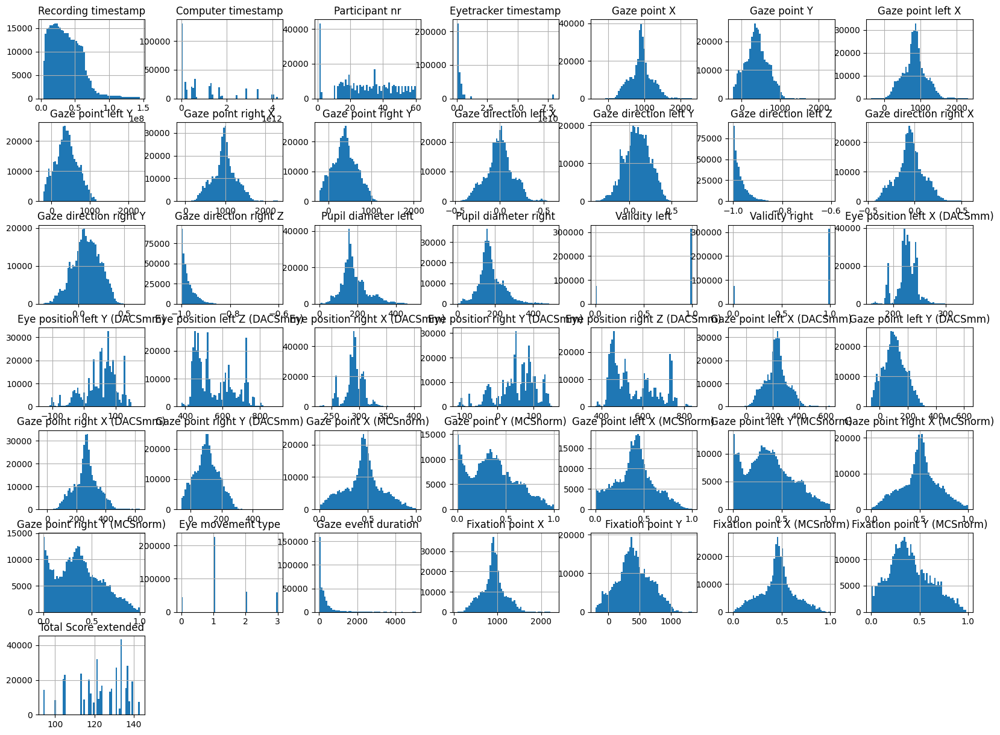

In [36]:
data_preprocessed.hist(bins=60, figsize=(20, 15));

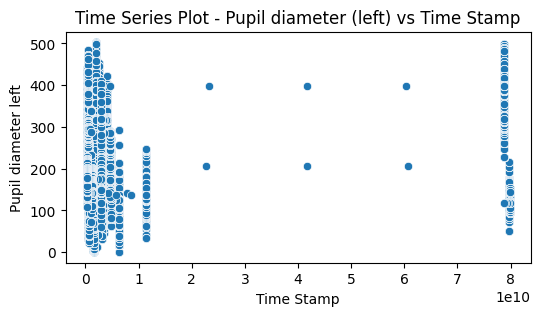

In [37]:
import seaborn as sns
plt.figure(figsize=(6, 3))
sns.scatterplot(x=data_preprocessed['Eyetracker timestamp'],y=data_preprocessed['Pupil diameter left'])
plt.xlabel('Time Stamp')
plt.ylabel('Pupil diameter left')
plt.title('Time Series Plot - Pupil diameter (left) vs Time Stamp')
plt.show()


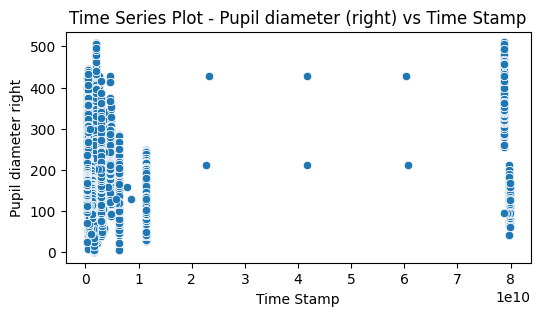

In [38]:
import seaborn as sns
plt.figure(figsize=(6, 3))
sns.scatterplot(x=data_preprocessed['Eyetracker timestamp'],y=data_preprocessed['Pupil diameter right'])
plt.xlabel('Time Stamp')
plt.ylabel('Pupil diameter right')
plt.title('Time Series Plot - Pupil diameter (right) vs Time Stamp')
plt.show()

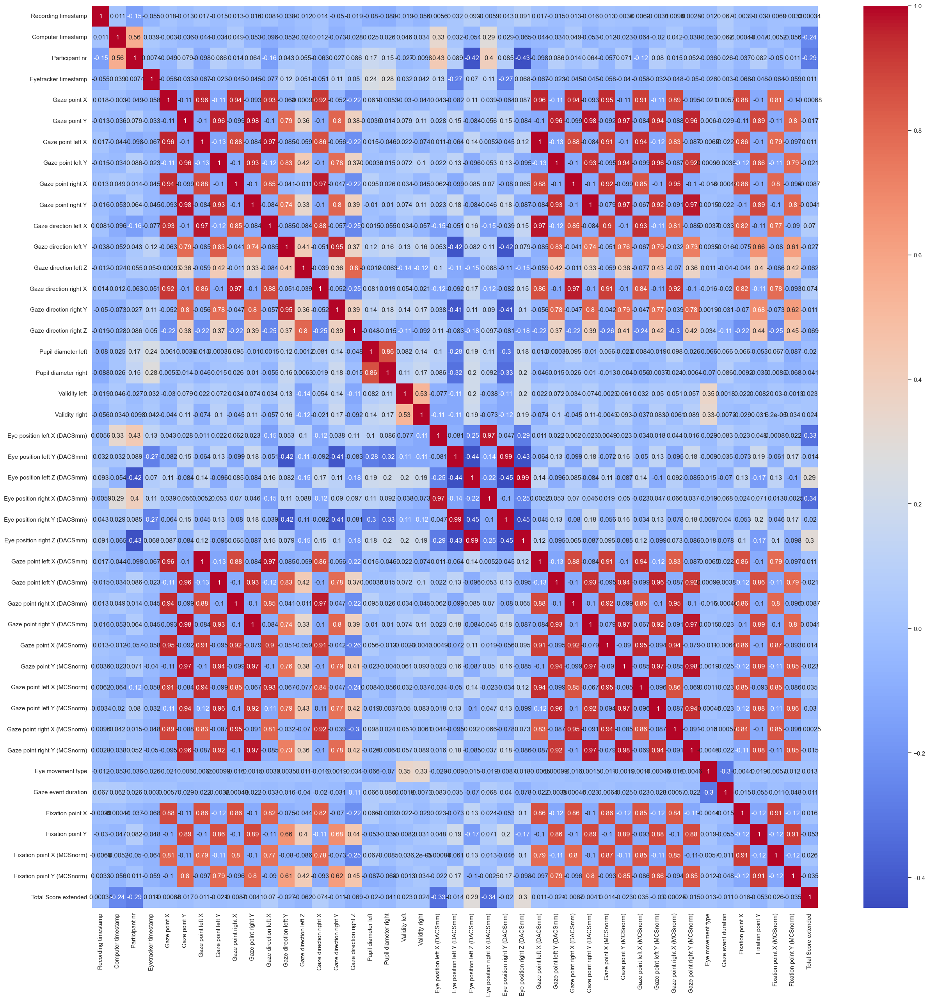

In [39]:
# ploting the correlation heatmap
corr = data_preprocessed.corr()
sns.set(style='white')
plt.figure(figsize=(30,30))
sns.heatmap(data_preprocessed.corr(), annot=True, cmap='coolwarm')
plt.show()

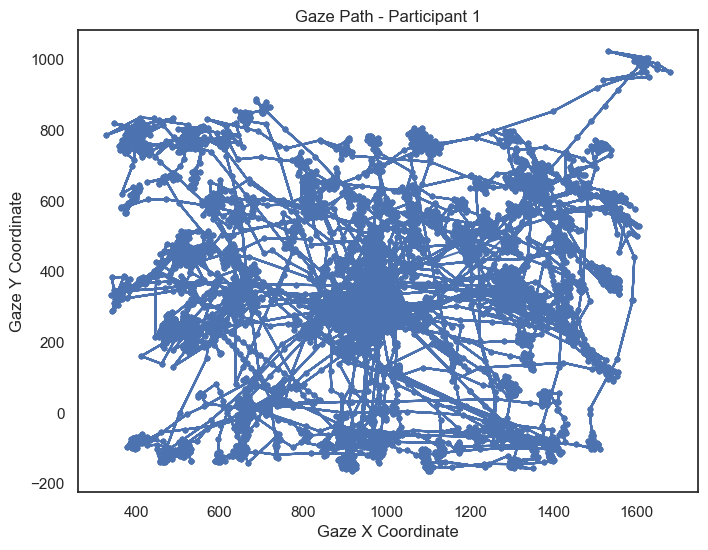

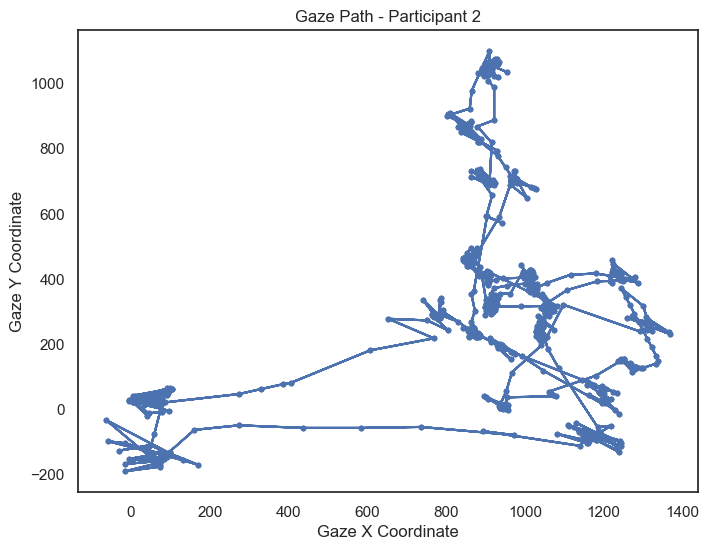

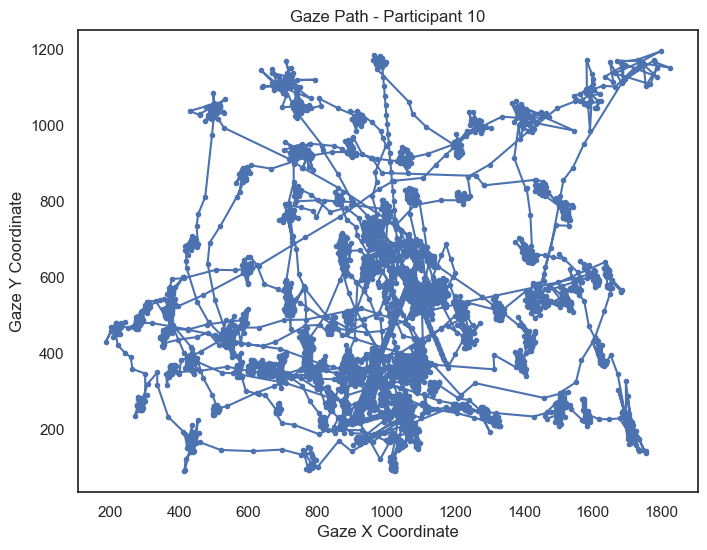

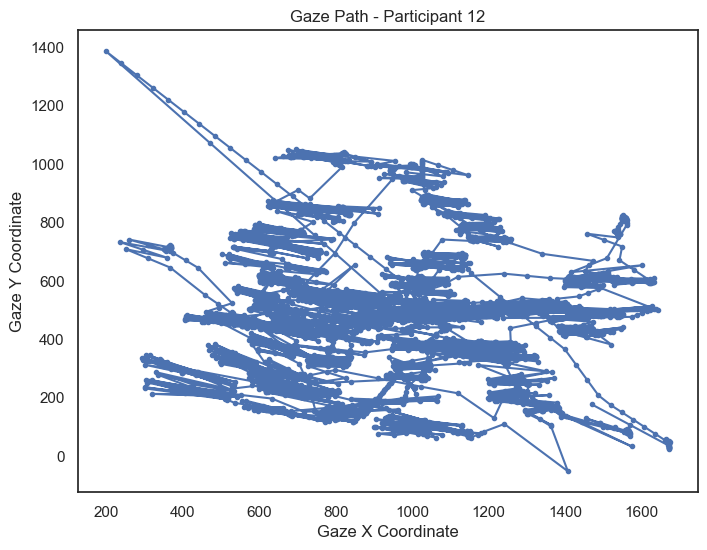

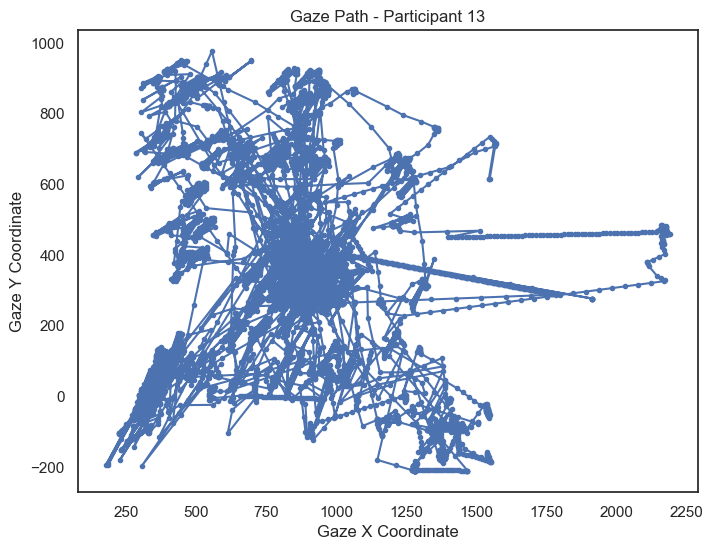

...

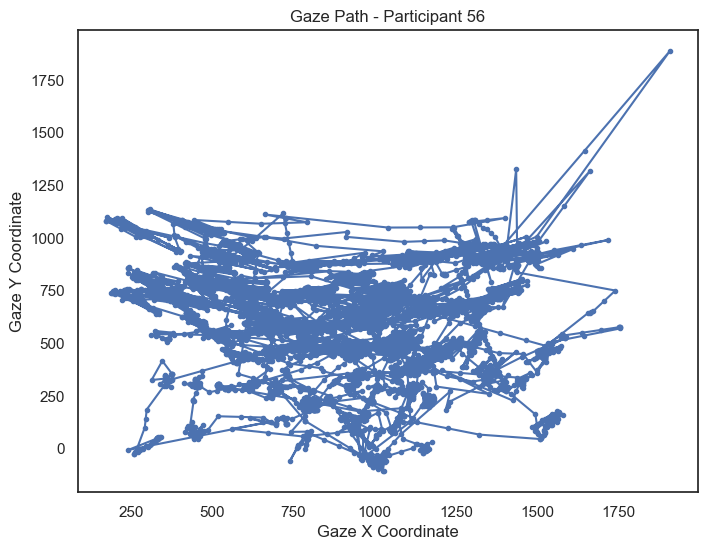

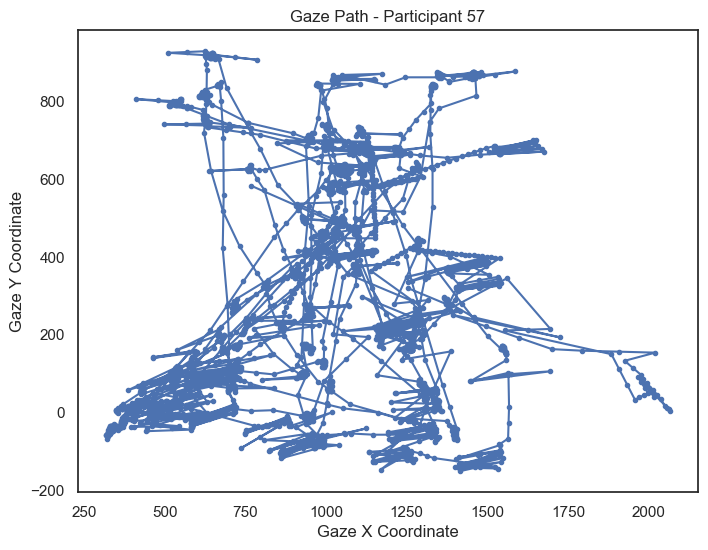

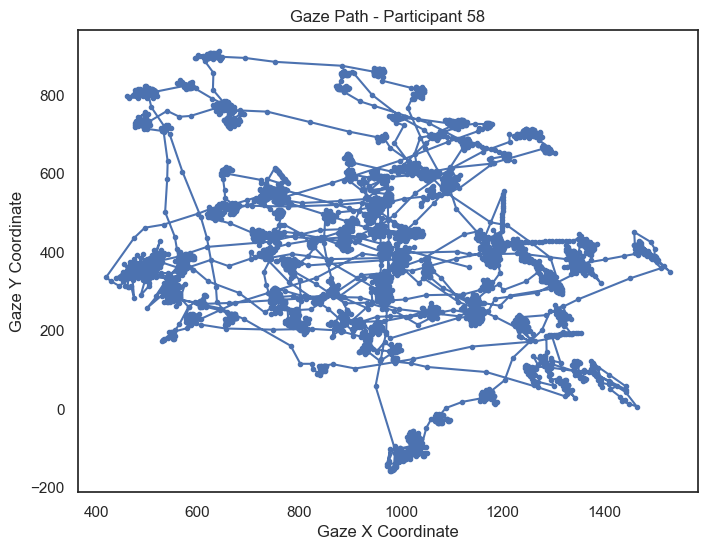

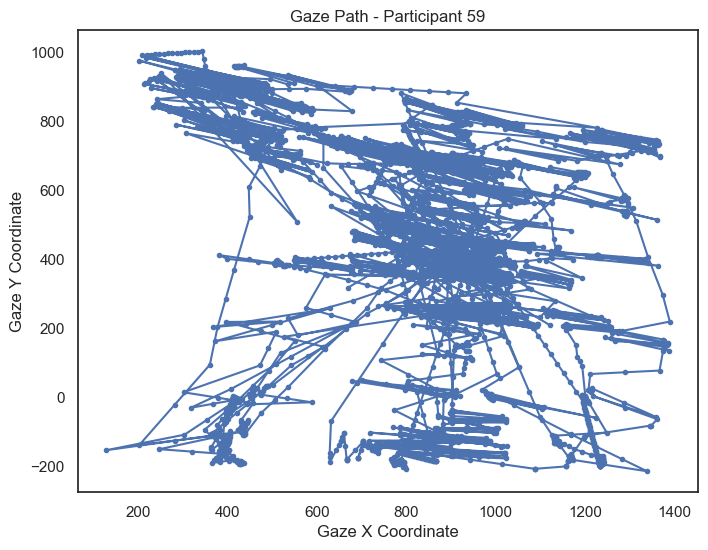

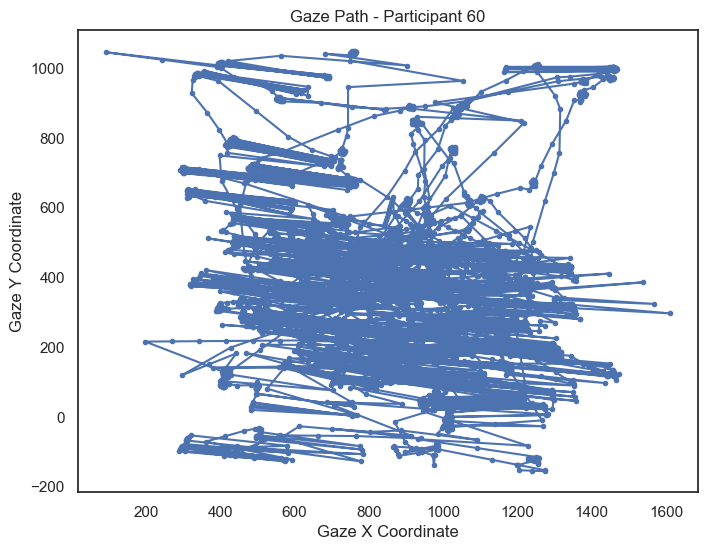

In [40]:
# Get a list of unique participant IDs
participant_ids = data_preprocessed['Participant nr'].unique()

# Iterate through each participant
for participant_id in participant_ids:
    # Extract data for the current participant
    participant_data = data_preprocessed[data_preprocessed['Participant nr'] == participant_id]
    
    # Example 1: Gaze Path Plot
    plt.figure(figsize=(8, 6))
    plt.plot(participant_data['Gaze point X'], participant_data['Gaze point Y'], '-o', markersize=3)
    plt.title(f'Gaze Path - Participant {participant_id}')
    plt.xlabel('Gaze X Coordinate')
    plt.ylabel('Gaze Y Coordinate')
    plt.show()

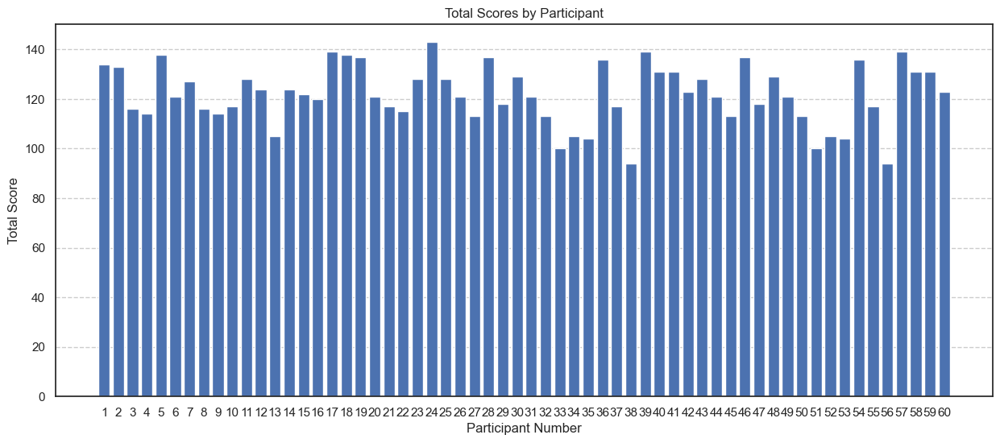

In [48]:
# Grouping the questionnaire data by Participant nr and summing their scores
participant_scores = question_Dataset.groupby('Participant nr')['Total Score extended'].sum().reset_index()

# Plotting the bar graph
plt.figure(figsize=(15, 6))
plt.bar(participant_scores['Participant nr'], participant_scores['Total Score extended'])
plt.title('Total Scores by Participant')
plt.xlabel('Participant Number')
plt.ylabel('Total Score')
plt.xticks(participant_scores['Participant nr'])
plt.grid(axis='y', linestyle='--')
plt.show()



# Time-Based Data Splitting for Time Series Analysis

In [63]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Sort the data by the time column
data_sorted = data_preprocessed.sort_values(by='Recording timestamp')

# Define the percentage of data to be used for testing
test_size = 0.2  # You can adjust this based on your preference

# Calculate the index at which to split the data into training and testing sets
split_index = int(len(data_sorted) * (1 - test_size))

# Split the data into training and testing sets
train_data = data_sorted.iloc[:split_index]
test_data = data_sorted.iloc[split_index:]

# Separate the features (X) and target variable (y) in the training and testing sets
X_train = train_data.drop(columns=['Total Score extended'])
y_train = train_data['Total Score extended']

X_test = test_data.drop(columns=['Total Score extended'])
y_test = test_data['Total Score extended']


# LinearRegression

In [67]:
from sklearn.linear_model import LinearRegression

from sklearn.metrics import mean_squared_error
# Initialize lists to store results for each fold
mse_scores = []

# Initialize the Linear Regression model
model = LinearRegression()
    
# Fit the model on the training data
model.fit(X_train, y_train)
    
# Make predictions on the test data
y_pred = model.predict(X_test)
    
# Calculate Mean Squared Error (MSE) for this fold and store it in the list
mse = mean_squared_error(y_test, y_pred)
mse_scores.append(mse)
print(f"MSE: {mse}")



MSE: 142.56902627519642


In [65]:
from sklearn.metrics import r2_score, mean_absolute_error

# Get the predicted scores from the model
y_pred = model.predict(X_test)

# Calculate R-squared (Coefficient of Determination)
r_squared = r2_score(y_test, y_pred)

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(y_test, y_pred)

print("R-squared:", r_squared)
print("Mean Absolute Error:", mae)


R-squared: 0.17915572716306927
Mean Absolute Error: 9.747103943243511


# RandomForest

In [66]:
from sklearn.ensemble import RandomForestRegressor

# Create a Random Forest Regressor object
rf_regressor = RandomForestRegressor(n_estimators=100, random_state=42)

# Fit the model to the training data
rf_regressor.fit(X_train, y_train)

# Make predictions on the test data
y_pred = rf_regressor.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r_squared = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r_squared}")
print(f"Mean Absolute Error: {mae}")


Mean Squared Error: 21.782492361289
R-squared: 0.8745868259746334
Mean Absolute Error: 1.5177703775808185
